In [1]:
import os
import numpy as np
import json
import sys
import torch
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score
# sys.path.insert(0, "D:\Document\End_project_2023\hrnet\Lite-HRNet")

c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def plt_imshow(img, title_name=None, axis_on = False, figsize=(6, 6), save_fig_at = None, dont_show_figure = False):
    fig, ax = plt.subplots(1, 1, figsize=(figsize))
    # if title_name != None: fig.suptitle(f"{title_name}", fontsize=16)  
    if title_name != None: plt.title(f"{title_name}") 
    if axis_on:
        plt.grid()
        # pass
    else:
        ax.axis('off')
    
    plt.tight_layout()
    ax.imshow(img)
    if save_fig_at != None: 
        plt.savefig(f"{save_fig_at}" )


    if not(dont_show_figure):
        # ax.imshow(img)
        plt.show()    

In [3]:
keypoints= [
                "Nose",
                "Left Eye",
                "Right Eye",
                "Left Ear",
                "Right Ear",
                "Left Shoulder",
                "Right Shoulder",
                "Left Elbow",
                "Right Elbow",
                "Left Wrist",
                "Right Wrist",
                "Left Hip",
                "Right Hip",
                "Left Knee",
                "Right Knee",
                "Left Ankle",
                "Right Ankle"
            ]

OKS_keypoint ={
                "Nose" :[],
                "Left Eye" :[],
                "Right Eye" :[],
                "Left Ear" :[],
                "Right Ear" :[],
                "Left Shoulder" :[],
                "Right Shoulder" :[],
                "Left Elbow" :[],
                "Right Elbow" :[],
                "Left Wrist" :[],
                "Right Wrist" :[],
                "Left Hip" :[],
                "Right Hip" :[],
                "Left Knee" :[],
                "Right Knee" :[],
                "Left Ankle" :[],
                "Right Ankle" :[] 
            }

In [4]:
def keypoint_similarity(gt_kpts, pred_kpts, sigmas, areas):
    """
    Params:
        gts_kpts: Ground-truth keypoints, Shape: [M, #kpts, 3],
                  where, M is the # of ground truth instances,
                         3 in the last dimension denotes coordinates: x,y, and visibility flag
                          
        pred_kpts: Prediction keypoints, Shape: [N, #kpts, 3]
                   where  N is the # of predicted instances,
 
        areas: Represent ground truth areas of shape: [M,]
 
    Returns:
        oks: The Object Keypoint Similarity (OKS) score tensor of shape: [M, N]
    """
     
    # epsilon to take care of div by 0 exception.
    EPSILON = torch.finfo(torch.float32).eps
     
    # Eucleidian dist squared:
    # d^2 = (x1 - x2)^2 + (y1 - y2)^2
    # Shape: (M, N, #kpts) --> [M, N, 17]
    dist_sq = (gt_kpts[:,None,:,0] - pred_kpts[...,0])**2 + (gt_kpts[:,None,:,1] - pred_kpts[...,1])**2
 
    # Boolean ground-truth visibility mask for v_i > 0. Shape: [M, #kpts] --> [M, 17]
    vis_mask = gt_kpts[..., 2].int() > 0
 
    # COCO assigns k = 2σ.
    k = 2*sigmas
 
    # Denominator in the exponent term. Shape: [M, 1, #kpts] --> [M, 1, 17]
    denom = 2 * (k**2) * (areas[:,None, None] + EPSILON)
 
    # Exponent term. Shape: [M, N, #kpts] --> [M, N, 17]
    exp_term = dist_sq / denom
 
    # Object Keypoint Similarity. Shape: (M, N)
    oks = (torch.exp(-exp_term) * vis_mask[:, None, :]).sum(-1) / (vis_mask[:, None, :].sum(-1) + EPSILON)
 
    return oks


In [5]:
def draw_keypoints(image, keypoints, lm_color=(0,255,0), edge_color=(0,255,0)):
     
    image = image.copy()
 
    radius = 2
 
    EDGES = [(0,1), (0,2), (1,3), (2,4), (3,5), (4,6), (5,7), (6,8), 
             (7,9), (8,10), (5,11), (6,12), (11,13), (12,14), (13,15), (14,16)]
 
    for edge in EDGES:
        src_x, src_y   = keypoints[edge[0]].astype("int").tolist()
        dest_x, dest_y = keypoints[edge[1]].astype("int").tolist()
        cv2.line(image, (src_x, src_y), (dest_x, dest_y), color=edge_color, thickness=2, lineType=cv2.LINE_AA)
 
    for idx, coords in enumerate(keypoints):
 
        loc_x, loc_y = coords.astype("int").tolist() 
 
        cv2.circle(image,
                   (loc_x, loc_y),
                   radius,
                   color=lm_color,
                   thickness=-1,
                   lineType=cv2.LINE_AA)
     
 
    return image

In [6]:
##################### Tính mAP từng keypoint

In [7]:
ground_truth_path = r".\data\coco\annotations\test.json"                   # annotation 
output_path = r"./output/output.json"                                      # predict                

with open(ground_truth_path, "r") as f:
    ground_truth = json.load(f)
    
with open(output_path, "r") as f:
    output = json.load(f)

KPTS_OKS_SIGMAS_COCO = torch.tensor([.26, .25, .25, .35, .35, .79, .79, .72, .72, .62,.62, 1.07, 1.07, .87, .87, .89, .89])/10.0

for threshold in [0.5, 0.75, 0.95]:
    
    print(f"With @OKS threshold = {threshold}")
    total_ap = 0
    for idx,keypoint in enumerate(keypoints):
        OKS = []
        Score = []
        
        for i in range(len(output)):
            gt_kpts = torch.tensor([ground_truth["annotations"][i]["keypoints"][idx*3:(idx*3+3)]], dtype = torch.float)
            det_kpts = torch.tensor([output[i]["preds"][0][idx]], dtype = torch.float)
            areas = torch.tensor([ground_truth["annotations"][i]["area"]])
            score_model = torch.tensor([output[i]["preds"][0][idx][2]])

            oks_coco = keypoint_similarity(gt_kpts.unsqueeze(0),
                                    det_kpts.unsqueeze(0),
                                    sigmas=KPTS_OKS_SIGMAS_COCO[idx],
                                    areas=areas)
            
            Score.append(score_model)
            OKS.append(oks_coco)
        y_true = np.array([1 if oks >= threshold else 0 for oks in OKS])
        y_scores = np.array([sc for sc in Score])  # Score
        
        # Precision và Recall
        precision, recall, _ = precision_recall_curve(y_true, y_scores)

        # AP
        ap = average_precision_score(y_true, y_scores)
        total_ap += ap
        calcu_oks = (sum(OKS)/len(output)).item()
        print(f'{keypoint} mAP: {ap:.4f} - OKS: {calcu_oks:.4f}')
    print(f"Total mAP {threshold} = {total_ap/17}")
    print(f"------------------------------------")

With @OKS threshold = 0.5
Nose mAP: 1.0000 - OKS: 0.9509
Left Eye mAP: 1.0000 - OKS: 0.9566
Right Eye mAP: 1.0000 - OKS: 0.9571
Left Ear mAP: 1.0000 - OKS: 0.9558
Right Ear mAP: 1.0000 - OKS: 0.9554
Left Shoulder mAP: 1.0000 - OKS: 0.9853
Right Shoulder mAP: 1.0000 - OKS: 0.9851
Left Elbow mAP: 1.0000 - OKS: 0.9762
Right Elbow mAP: 1.0000 - OKS: 0.9606
Left Wrist mAP: 1.0000 - OKS: 0.9656
Right Wrist mAP: 0.9983 - OKS: 0.9295
Left Hip mAP: 1.0000 - OKS: 0.9740
Right Hip mAP: 1.0000 - OKS: 0.9749
Left Knee mAP: 1.0000 - OKS: 0.9816
Right Knee mAP: 0.9996 - OKS: 0.9653
Left Ankle mAP: 0.9904 - OKS: 0.9364
Right Ankle mAP: 0.9948 - OKS: 0.9423
Total mAP 0.5 = 0.9990033210004025
------------------------------------
With @OKS threshold = 0.75
Nose mAP: 0.9942 - OKS: 0.9509
Left Eye mAP: 1.0000 - OKS: 0.9566
Right Eye mAP: 1.0000 - OKS: 0.9571
Left Ear mAP: 0.9784 - OKS: 0.9558
Right Ear mAP: 1.0000 - OKS: 0.9554
Left Shoulder mAP: 1.0000 - OKS: 0.9853
Right Shoulder mAP: 1.0000 - OKS: 0.985

In [8]:
##################### Tính mAP từng ảnh

@OKS = 0.5


c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\sklearn\metrics\_ranking.py:1030: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\sklearn\metrics\_ranking.py:1030: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\sklearn\metrics\_ranking.py:1030: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\sklearn\metrics\_ranking.py:1030: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\User\anaconda3\envs\hrnet\lib\site-packages\sklearn\metrics\_ranking.py:1030: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
c:\Users\User\anaconda3\envs\hrnet\

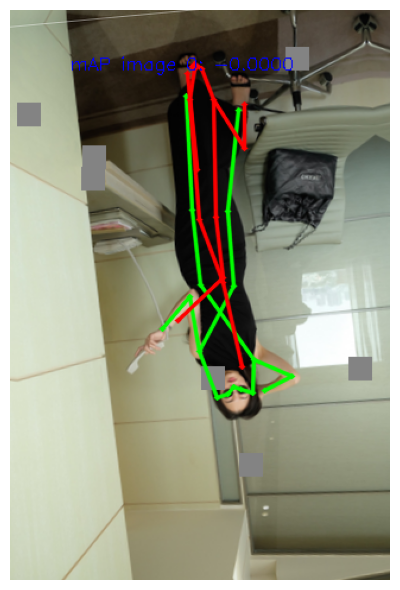

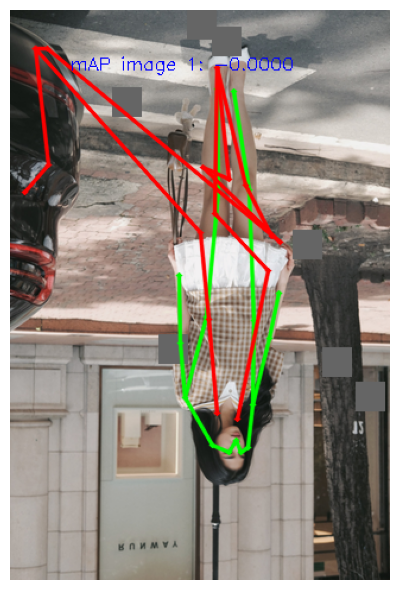

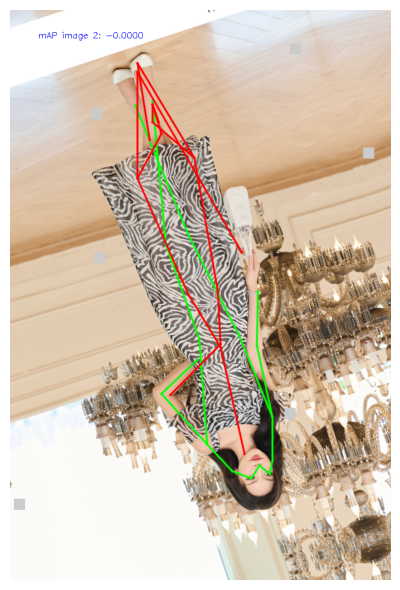

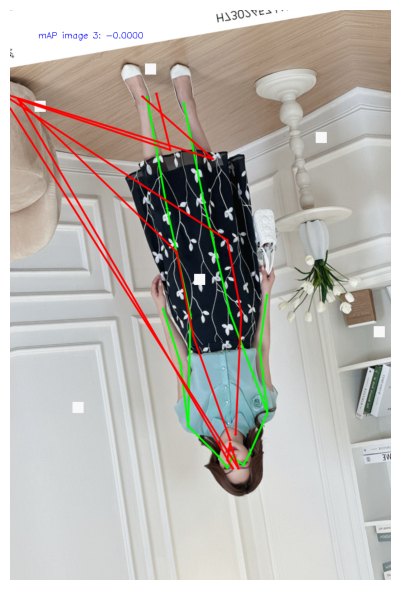

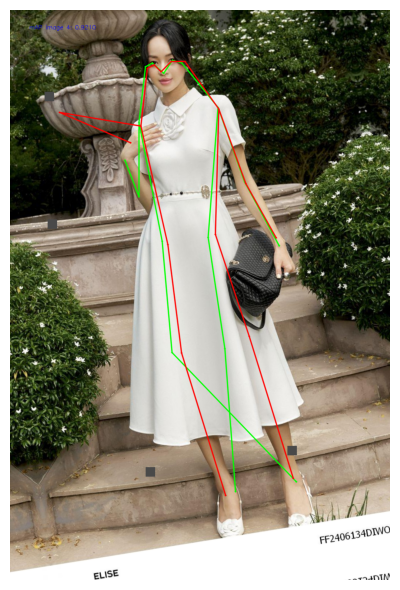

...

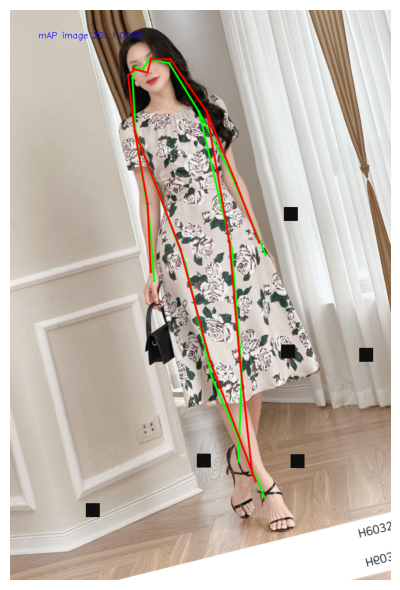

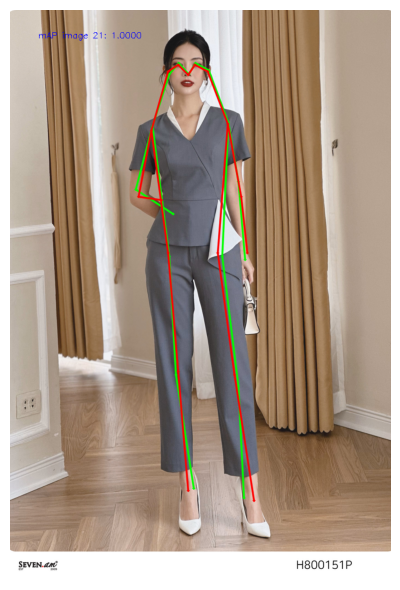

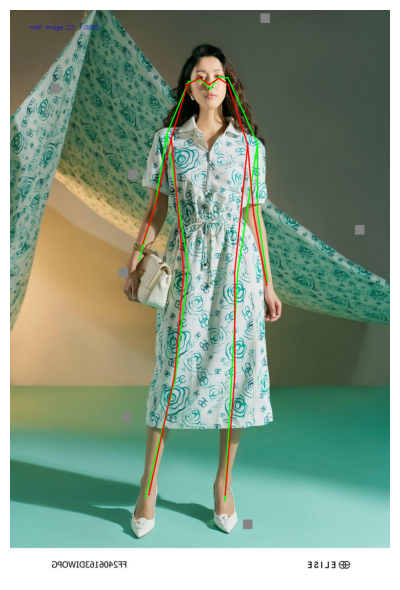

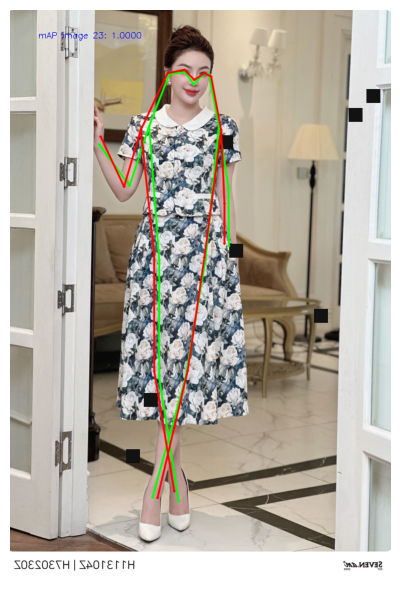

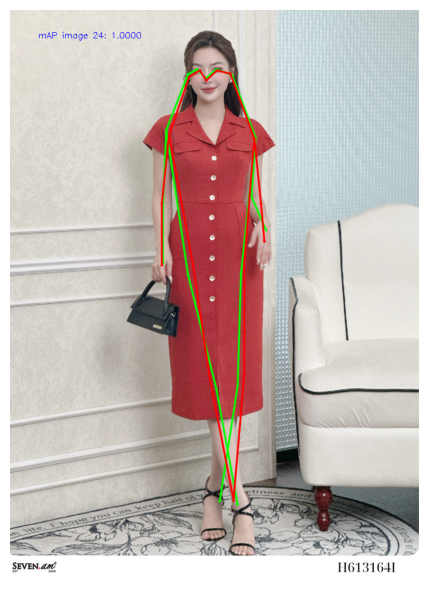

In [9]:
# Tìm mAP min của từng ảnh
ground_truth_path = r".\data\coco\annotations\test.json"                   # annotation 
output_path = r"./output/output2.json"                                      # predict                

with open(ground_truth_path, "r") as f:
    ground_truth = json.load(f)
    
with open(output_path, "r") as f:
    output = json.load(f)
    
KPTS_OKS_SIGMAS_COCO = torch.tensor([.26, .25, .25, .35, .35, .79, .79, .72, .72, .62,.62, 1.07, 1.07, .87, .87, .89, .89])/10.0
threshold = 0.5
print(f"@OKS = {threshold}")

all_aps = []
totals_ap =0
for i in range(len(output)):
    OKS = []
    Score = []
    for idx, keypoint in enumerate(keypoints):

        gt_kpts = torch.tensor([ground_truth["annotations"][i]["keypoints"][idx*3:(idx*3+3)]], dtype = torch.float)
        det_kpts = torch.tensor([output[i]["preds"][0][idx]], dtype = torch.float)
        areas = torch.tensor([ground_truth["annotations"][i]["area"]])
        score_model = torch.tensor([output[i]["preds"][0][idx][2]])

        oks_coco = keypoint_similarity(gt_kpts.unsqueeze(0),
                                    det_kpts.unsqueeze(0),
                                    sigmas=KPTS_OKS_SIGMAS_COCO[idx],
                                    areas=areas)
        
        OKS.append(oks_coco)
        Score.append(score_model)
    y_true = np.array([1 if oks >= threshold else 0 for oks in OKS])
    y_scores = np.array([sc for sc in Score])  # Score

    # Precision và Recall
    precision, recall, _ = precision_recall_curve(y_true, y_scores)

    # AP
    ap = average_precision_score(y_true, y_scores)

    totals_ap += ap
    all_aps.append((ap, output[i]["image_paths"][0], ground_truth["annotations"][i]["keypoints"], output[i]["preds"]))

# print(totals_ap/len(output))
sorted_aps = sorted(all_aps, key=lambda x: x[0])
for i in range(len(output)):
    min_ap, path_img, keypoints_ground_truth, keypoints_output_draw = sorted_aps[i]
    # print(path_img)
    # print(f"mAP image {i}: {min_ap:.4f}")
    text= f"mAP image {i}: {min_ap:.4f}"
    base_path = r"D:\Document\End_project_2023\hrnet\Lite-HRNet"
    path_img = base_path + "/" + path_img
    image = cv2.imread(path_img)
    
    keypoints_ground_truth = np.array(keypoints_ground_truth).reshape(17,3).astype(int)
    keypoints_ground_truth = keypoints_ground_truth[:,:2]
    keypoints_output_draw = np.array(keypoints_output_draw[0]).astype(int)
    keypoints_output_draw = keypoints_output_draw[:,:2]
    img_draw = draw_keypoints(image, keypoints_ground_truth, lm_color=(0,255,0), edge_color=(0,255,0))            # Xanh lá là label
    img_draw2 = draw_keypoints(img_draw, keypoints_output_draw, lm_color=(0,0,255), edge_color=(0,0,255))              # Đỏ là dự đoán
    cv2.putText(img_draw2, text= text, org =(50,50), fontScale = 0.5, fontFace=cv2.FONT_HERSHEY_SIMPLEX, color= (255, 0, 0), thickness=1)
    plt_imshow(cv2.cvtColor(img_draw2, cv2.COLOR_BGR2RGB))
    
    


In [7]:
##################### Tính mAP tất cả các ảnh

In [7]:
ground_truth_path = r".\data\coco\annotations\test.json"                   # annotation 
output_path = r"./output/output.json"                                      # predict                

with open(ground_truth_path, "r") as f:
    ground_truth = json.load(f)
    
with open(output_path, "r") as f:
    output = json.load(f)

KPTS_OKS_SIGMAS_COCO = torch.tensor([.26, .25, .25, .35, .35, .79, .79, .72, .72, .62,.62, 1.07, 1.07, .87, .87, .89, .89])/10.0
for threshold in [0.5 , 0.75, 0.95]:
    # print(f"@OKS threshold = {threshold}")

    min = 1
    all_aps = []
    OKS = []
    Score = []
    for i in range(len(output)):
        
        gt_kpts_all = []
        det_kpts_all = []
        for idx, keypoint in enumerate(keypoints):
            gt_kpts_all.append(ground_truth["annotations"][i]["keypoints"][idx*3:(idx*3+3)])
            det_kpts_all.append(output[i]["preds"][0][idx])
            
        gt_kpts = torch.tensor(gt_kpts_all, dtype = torch.float) 
        det_kpts = torch.tensor(det_kpts_all, dtype = torch.float)
        areas = torch.tensor([ground_truth["annotations"][i]["area"]])
        score_model = torch.tensor(output[i]["preds"][0][idx][2])
        oks_coco = keypoint_similarity(gt_kpts.unsqueeze(0),
                                det_kpts.unsqueeze(0),
                                sigmas=KPTS_OKS_SIGMAS_COCO,
                                areas=areas)
        
        OKS.append(oks_coco)
        Score.append(score_model)
        

    y_true = np.array([1 if oks >= threshold else 0 for oks in OKS])
    y_scores = np.array([sc for sc in Score])  # Score

    # Precision và Recall
    precision, recall, _ = precision_recall_curve(y_true, y_scores)

    # AP
    ap = average_precision_score(y_true, y_scores)
    print(f'Threshold @OKS = {threshold},  mAP_all = {ap}')


Threshold @OKS = 0.5,  mAP_all = 1.0
Threshold @OKS = 0.75,  mAP_all = 1.0
Threshold @OKS = 0.95,  mAP_all = 0.8994787884123783
